In [45]:
import torch
import torch.nn.functional as F
import  random
import  matplotlib.pyplot as plt
from sympy.printing.pytorch import torch
%matplotlib inline

In [1]:
words=open('names.txt','r').read().splitlines()
words[:8]

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia']

In [2]:
len(words)

32033

In [16]:
chars=sorted(list(set(''.join(words))))
stoi={s:i+1 for i ,s in enumerate(chars)}
stoi['.']=0
itos={i:s for s,i in stoi.items()}
print(itos)

{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


In [17]:
block_size=3
X,Y=[],[]
for w in words:
    context=[0]*block_size
    for ch in w+'.':
        ix=stoi[ch]
        X.append(context)
        Y.append(ix)
        print(''.join(itos[i] for i in context), '--->', itos[ix])
        context=context[1:]+[ix]
X=torch.tensor(X)
Y=torch.tensor(Y)

... ---> e
..e ---> m
.em ---> m
emm ---> a
mma ---> .
... ---> o
..o ---> l
.ol ---> i
oli ---> v
liv ---> i
ivi ---> a
via ---> .
... ---> a
..a ---> v
.av ---> a
ava ---> .
... ---> i
..i ---> s
.is ---> a
isa ---> b
sab ---> e
abe ---> l
bel ---> l
ell ---> a
lla ---> .
... ---> s
..s ---> o
.so ---> p
sop ---> h
oph ---> i
phi ---> a
hia ---> .
... ---> c
..c ---> h
.ch ---> a
cha ---> r
har ---> l
arl ---> o
rlo ---> t
lot ---> t
ott ---> e
tte ---> .
... ---> m
..m ---> i
.mi ---> a
mia ---> .
... ---> a
..a ---> m
.am ---> e
ame ---> l
mel ---> i
eli ---> a
lia ---> .
... ---> h
..h ---> a
.ha ---> r
har ---> p
arp ---> e
rpe ---> r
per ---> .
... ---> e
..e ---> v
.ev ---> e
eve ---> l
vel ---> y
ely ---> n
lyn ---> .
... ---> a
..a ---> b
.ab ---> i
abi ---> g
big ---> a
iga ---> i
gai ---> l
ail ---> .
... ---> e
..e ---> m
.em ---> i
emi ---> l
mil ---> y
ily ---> .
... ---> e
..e ---> l
.el ---> i
eli ---> z
liz ---> a
iza ---> b
zab ---> e
abe ---> t
bet ---> h
eth ---> .

In [9]:
X.shape, X.dtype, Y.shape, Y.dtype

(torch.Size([228146, 3]), torch.int64, torch.Size([228146]), torch.int64)

In [18]:
def build_dataset(words):
    block_size=3
    X,Y=[],[]
    for w in words:
        context=[0]*block_size
        for ch in w+'.':
            ix=stoi[ch]
            X.append(context)
            Y.append(ix)
            print(''.join(itos[i] for i in context), '--->', itos[ix])
            context=context[1:]+[ix]
    X=torch.tensor(X)
    Y=torch.tensor(Y)
    return X,Y

In [138]:
random.seed(42)
random.shuffle(words)
n1=int(0.9*len(words))
n2=int(0.8*len(words))
Xtr,Ytr=build_dataset(words[:n1])
Xdev,Ydev=build_dataset(words[n1:n2])
Xte,Yte=build_dataset(words[n2:])
print(Xdev,Ydev)

... ---> e
..e ---> b
.eb ---> r
ebr ---> i
bri ---> m
rim ---> a
ima ---> .
... ---> h
..h ---> i
.hi ---> l
hil ---> t
ilt ---> o
lto ---> n
ton ---> .
... ---> j
..j ---> h
.jh ---> e
jhe ---> n
hen ---> e
ene ---> .
... ---> m
..m ---> a
.ma ---> n
man ---> a
ana ---> h
nah ---> i
ahi ---> l
hil ---> .
... ---> n
..n ---> a
.na ---> i
nai ---> a
aia ---> h
iah ---> .
... ---> j
..j ---> e
.je ---> n
jen ---> i
eni ---> s
nis ---> h
ish ---> a
sha ---> .
... ---> j
..j ---> a
.ja ---> h
jah ---> z
ahz ---> i
hzi ---> a
zia ---> h
iah ---> .
... ---> n
..n ---> a
.na ---> i
nai ---> a
aia ---> .
... ---> k
..k ---> u
.ku ---> m
kum ---> a
uma ---> r
mar ---> .
... ---> k
..k ---> a
.ka ---> z
kaz ---> i
azi ---> y
ziy ---> a
iya ---> h
yah ---> .
... ---> l
..l ---> e
.le ---> a
lea ---> r
ear ---> t
art ---> .
... ---> n
..n ---> e
.ne ---> y
ney ---> t
eyt ---> h
yth ---> a
tha ---> n
han ---> .
... ---> b
..b ---> e
.be ---> t
bet ---> t
ett ---> e
tte ---> .
... ---> j
..j ---> a

In [40]:
C=torch.randn(27,2)


In [21]:
C[5]

tensor([1.7531, 0.7606])

In [23]:
F.one_hot(torch.tensor(5),num_classes=27).float() @ C

tensor([1.7531, 0.7606])

In [24]:
C[X].shape

torch.Size([228146, 3, 2])

In [41]:
emb=C[X]
emb.shape

torch.Size([228146, 3, 2])

In [42]:
w1=torch.randn((6,100))
b1=torch.randn(100)

In [52]:
torch.cat([emb[:,0,:],emb[:,1,:],emb[:,2,:]],1).shape

torch.Size([228146, 6])

In [66]:
torch.cat(torch.unbind(emb,1),1)


tensor([[ 0.5168, -0.1481,  0.5168, -0.1481,  0.5168, -0.1481],
        [ 0.5168, -0.1481,  0.5168, -0.1481,  0.8125,  1.8377],
        [ 0.5168, -0.1481,  0.8125,  1.8377, -0.3228, -0.2766],
        ...,
        [-1.3422,  2.1139, -1.3422,  2.1139,  1.3041,  0.5431],
        [-1.3422,  2.1139,  1.3041,  0.5431, -1.3422,  2.1139],
        [ 1.3041,  0.5431, -1.3422,  2.1139, -0.3091, -0.4365]])

In [49]:
h=torch.tanh(emb.view(-1,6)@w1+b1)
h

tensor([[ 0.9462,  0.6819,  0.5716,  ..., -0.0986, -0.2668, -0.9124],
        [-0.8106, -0.9957, -0.9473,  ..., -0.5594,  0.9964, -0.0375],
        [-0.4942,  0.8374, -0.9745,  ...,  0.6560, -0.3011,  0.9874],
        ...,
        [ 0.5510, -0.0881, -0.9990,  ..., -0.8104, -1.0000,  0.9986],
        [-0.9834, -1.0000, -0.9932,  ..., -1.0000,  0.9533,  0.9914],
        [-0.9984,  0.9946, -0.4872,  ...,  1.0000, -0.8185,  0.9930]])

In [67]:
h.shape

torch.Size([228146, 100])

In [68]:
(emb.view(-1,6)@w1).shape

torch.Size([228146, 100])

In [54]:
W2 = torch.randn((100, 27))
b2 = torch.randn(27)

In [56]:
logits = h @ W2 + b2
logits

tensor([[-11.0780,   2.6370,   9.4940,  ...,   7.9414,  -1.8478,  -5.9077],
        [ -7.2943,  11.9204,  -1.2388,  ...,  -1.8478,  -7.5755, -13.4989],
        [-13.6193,   7.4775,   1.5030,  ...,  -2.8143,   2.9256,  -5.4775],
        ...,
        [-22.2359,   1.2041,   3.0508,  ...,  -8.9626,  -1.1969,  -2.2541],
        [-16.2843,   3.1260,  -3.5493,  ..., -10.8733,   8.4996,  -8.2548],
        [ -3.4959,  17.3908,   0.6070,  ...,  -6.1394,  -0.2860,   7.3419]])

In [57]:
logits.shape

torch.Size([228146, 27])

In [69]:
counts=logits.exp()

In [70]:
prob=counts/counts.sum(1,keepdim=True)

In [72]:
prob.shape

torch.Size([228146, 27])

In [90]:
loss=-prob[torch.arange(X.shape[0]),Y].log().mean()

In [91]:
loss

tensor(16.8026)

In [92]:
Xtr.shape, Ytr.shape

(torch.Size([205280, 3]), torch.Size([205280]))

In [96]:
g = torch.Generator().manual_seed(2147483647)
C=torch.randn((27,10),generator=g)
W1 = torch.randn((30, 200), generator=g)
b1 = torch.randn(200, generator=g)
W2 = torch.randn((200, 27), generator=g)
b2 = torch.randn(27, generator=g)
parametes=[C, W1, b1, W2, b2]
parametes

[tensor([[ 1.5674e+00, -2.3729e-01, -2.7385e-02, -1.1008e+00,  2.8588e-01,
          -2.9644e-02, -1.5471e+00,  6.0489e-01,  7.9136e-02,  9.0462e-01],
         [-4.7125e-01,  7.8682e-01, -3.2844e-01, -4.3297e-01,  1.3729e+00,
           2.9334e+00,  1.5618e+00, -1.6261e+00,  6.7716e-01, -8.4040e-01],
         [ 9.8488e-01, -1.4837e-01, -1.4795e+00,  4.4830e-01, -7.0731e-02,
           2.4968e+00,  2.4448e+00, -6.7006e-01, -1.2199e+00,  3.0314e-01],
         [-1.0725e+00,  7.2762e-01,  5.1114e-02,  1.3095e+00, -8.0220e-01,
          -8.5042e-01, -1.8068e+00,  1.2523e+00, -1.2256e+00,  1.2165e+00],
         [-9.6478e-01, -2.3211e-01, -3.4762e-01,  3.3244e-01, -1.3263e+00,
           1.1224e+00,  5.9641e-01,  4.5846e-01,  5.4011e-02, -1.7400e+00],
         [ 1.1560e-01,  8.0319e-01,  5.4108e-01, -1.1646e+00,  1.4756e-01,
          -1.0006e+00,  3.8012e-01,  4.7328e-01, -9.1027e-01, -7.8305e-01],
         [ 1.3506e-01, -2.1161e-01, -1.0406e+00, -1.5367e+00,  9.3743e-01,
          -8.8303e-

In [97]:
sum(p.nelement() for p in parametes)

11897

In [98]:
F.cross_entropy(logits,Y)


tensor(16.8026)

In [105]:
for p in parametes:
  p.requires_grad = True
loss.backward

<bound method Tensor.backward of tensor(16.8026)>

In [106]:
lre = torch.linspace(-3, 0, 1000)
lrs = 10**lre

In [107]:
lri = []
lossi = []
stepi = []

In [110]:
for i in range(200000):

  # minibatch construct
  ix = torch.randint(0, Xtr.shape[0], (32,))

  # forward pass
  emb = C[Xtr[ix]] # (32, 3, 10)
  h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 200)
  logits = h @ W2 + b2 # (32, 27)
  loss = F.cross_entropy(logits, Ytr[ix])
  #print(loss.item())

  # backward pass
  for p in parametes:
    p.grad = None
  loss.backward()

  # update
  #lr = lrs[i]
  lr = 0.1 if i < 100000 else 0.01
  for p in parametes:
    p.data += -lr * p.grad

  # track stats
  #lri.append(lre[i])
  stepi.append(i)
  lossi.append(loss.log10().item())

In [144]:
for i in range(200000):
    ix =torch.randint(0,Xtr.shape[0],(32,))

    emb=C[Xtr[ix]]
    h=torch.tanh(emb.view(-1,30) @ W1 + b1)
    logits=h@W2 +b2
    loss=F.cross_entropy(logits,Ytr[ix])
    for p in parametes:
        p.grad=None
    loss.backward()
    lr = 0.1 if i < 100000 else 0.01
    for p in parametes:
        p.data+=-lr*p.grad
    #lri.append(lre[i])
    stepi.append(i)
    lossi.append(loss.log10().item())

In [128]:
logits.max(1)

torch.return_types.max(
values=tensor([-3.8147,  6.7126, -3.8147, -3.8147,  5.4260,  9.3674, 10.8340,  4.0118,
         7.6174,  2.3998,  5.7629,  4.4533,  6.6576, 10.3202, -3.8147,  2.8796,
         0.6522, 10.9392,  4.1151, 10.4400,  2.3998, -3.8147,  9.4709,  9.7108,
         6.3540,  4.1151,  2.6431,  8.8449, 12.0057,  4.1482,  7.3260, -0.0272],
       grad_fn=<MaxBackward0>),
indices=tensor([ 1,  9,  1,  1,  0,  0, 14, 13,  1, 19,  0, 18, 25,  0,  1,  1, 12,  0,
         1,  0, 19,  1,  0, 15,  1,  1,  1,  1, 12, 12,  1, 12]))

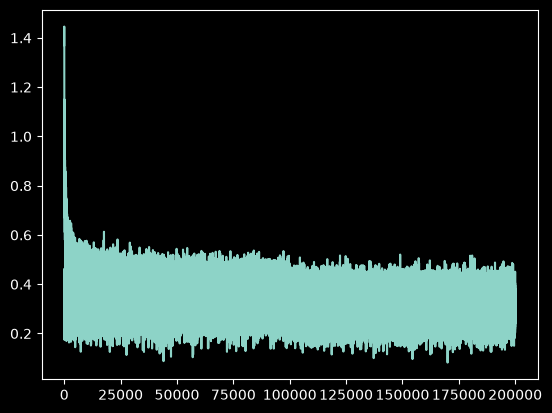

In [125]:
plt.plot(stepi, lossi)

In [133]:
emb = C[Xtr] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ytr)
loss


tensor(2.2261, grad_fn=<NllLossBackward0>)

In [ ]:
emb = C[Xdev] # (32, 3, 2)
h = torch.tanh(emb.view(-1, 30) @ W1 + b1) # (32, 100)
logits = h @ W2 + b2 # (32, 27)
loss = F.cross_entropy(logits, Ydev)
loss

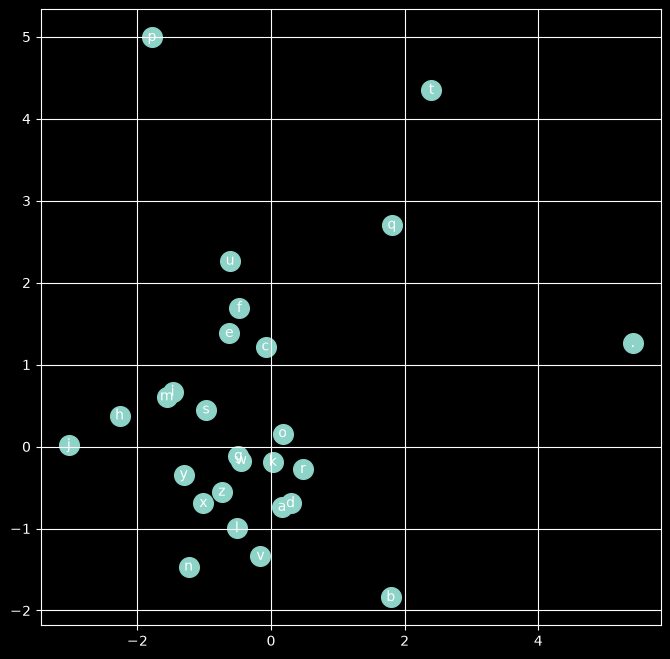

In [139]:
plt.figure(figsize=(8,8))
plt.scatter(C[:,0].data, C[:,1].data, s=200)
for i in range(C.shape[0]):
    plt.text(C[i,0].item(), C[i,1].item(), itos[i], ha="center", va="center", color='white')
plt.grid('minor')

In [142]:
context = [0] * block_size
C[torch.tensor([context])].shape

torch.Size([1, 3, 10])

In [143]:
g = torch.Generator().manual_seed(2147483647 + 10)

for _ in range(20):

    out = []
    context = [0] * block_size # initialize with all ...
    while True:
      emb = C[torch.tensor([context])] # (1,block_size,d)
      h = torch.tanh(emb.view(1, -1) @ W1 + b1)
      logits = h @ W2 + b2
      probs = F.softmax(logits, dim=1)
      ix = torch.multinomial(probs, num_samples=1, generator=g).item()
      context = context[1:] + [ix]
      out.append(ix)
      if ix == 0:
        break

    print(''.join(itos[i] for i in out))

carpa.
xamella.
khyrmel.
ree.
casparson.
jazhuen.
ameryst.
aree.
ane.
ani.
tcheliy.
kaleigh.
ham.
noa.
dessan.
anor.
ann.
andrawson.
andearyse.
ahmer.
